<a href="https://colab.research.google.com/github/thielis/EstudoAIeCDUFES/blob/main/TCC_Thielis_Pos_UFES_CD_e_IA_Experimento.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Classificação de Imagens com Visão Computacional comparando HOG + SVM com Redes Neurais Convolucionais**

## ESPECIALIZAÇÃO INTELIGÊNCIA ARTIFICIAL & CIÊNCIA DE DADOS
### UFES / UNAC

## Experimento para TCC, 2025

### Aluno: Thielis Barroso Ferreira
### Orientador: Josinaldo de Oliveira Dias

####Parcerias e contribuições:

- Mariana Segato Milanez
- Yara Lacerda Viana

# Introdução

Experimento baseado em Algoritimos de aprendizado de máquina para Visão Computacional analisando o desempenho do descritor HOG (Histogram of Oriented Gradients) combinado com um classificador SVM (Support Vector Machine) - abordagem clássica - e Redes Neurais Convulocionais (CNNs), que são mais complexos - abordagem moderna - extranindo as estatísticas de performance dos modelos permitindo analisar suas vantagens e desvantagens, com objetivo de detectar imagens específicas no conjunto de dados CIFAR-10 em que é amplamente utilizado no campo da visão computacional e do aprendizado de máquina.

# Metodologia

Uitilzar algoritimos vanguarda em Python e suas bibliotecas disponíveis para calssificação de imagens com uma abordagem mais clássica utilizando descritor HOG combinado com um classificador SVM.

Para comparação modelos mais avançados composto por algoritimos de Redes Neurais Convolucionais (CNNs) que já consiste uma abordagem mais moderna.

## Objetivo

O objetivo deste experimento é  identificar images de gatos contido no conjunto de dados (dataset) CIFAR-10, utilizando os algoritimos de Visão computacional HOG+SVM e CNNs para comparar o desempenho, vantagens e desvantagens de cada abordagem.

# Carregamento de dependências e bibliotecas

In [ ]:
# Fazer downgrade do numpy antes para rodar em ambiente JupyterLab Desktop
# pip install "numpy<2.0" --force-reinstall

In [ ]:
import numpy as np
import pandas as pd
from skimage.feature import hog
from skimage.color import rgb2gray
from sklearn.svm import LinearSVC
from sklearn.metrics import classification_report, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from tensorflow.keras.datasets import cifar10
import matplotlib.pyplot as plt
import cv2
import seaborn as sns

# Conjunto de Dado (Dataset)

Base de dados "CIFAR-10 - Object Recognition in Images" usada disponível em: https://keras.io/api/datasets/cifar10/

Dataset: CIFAR-10

60.000 imagens coloridas 32x32 em 10 classes. com 6.000 imagens por classe. Existem 50.000 imagens de treinamento e 10.000 imagens de teste.


Usaremos:
- Classe positiva: cat
- Classe negativa: as outras 9

- As imagens são pequenas, então HOG precisa ser ajustado cuidadosamente.



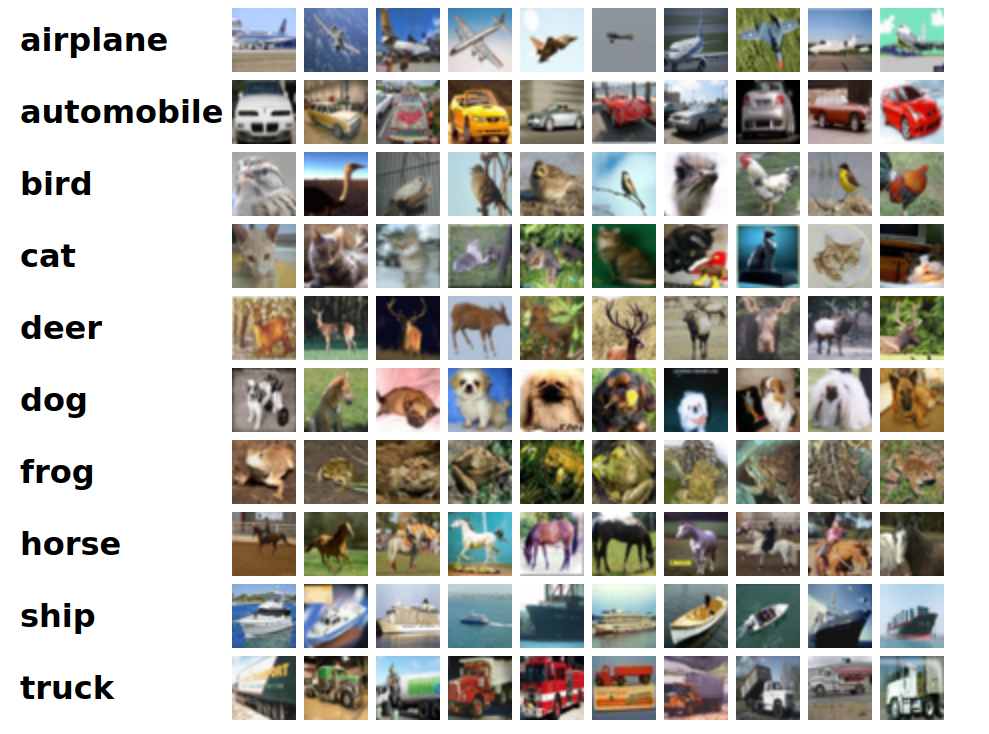

### Carregar e preparar o dataset CIFAR-10
Carregamento do conjunto CIFAR-10



In [ ]:
(x_train, y_train), (x_test, y_test) = cifar10.load_data()
x = np.concatenate([x_train, x_test])
y = np.concatenate([y_train, y_test]).flatten()

O dataset CIFAR-10 já tem separado conjunto de teste e treinamento.

### Convertendo para abordagem binária, então, gato = 1, outros = 0

In [ ]:
y_bin = np.where(y == 3, 1, 0)

### Balancear o conjunto: mesma quantidade de gatos e não-gatos

Balancear um dataset é crucial para treinar modelos de aprendizado de máquina, especialmente quando uma classe (como 'gato' no nosso caso) tem muito menos exemplos do que outras ('não-gato'). Se o dataset não for balanceado, o modelo pode:

- pode aprender a prever a classe majoritária na maioria das vezes, porque isso lhe renderá uma alta acurácia geral. No entanto, ele será muito ruim em identificar a classe minoritária, que é geralmente a mais interessante (como detectar uma doença rara ou fraude).
- Overfitting na classe majoritária: O modelo se ajusta excessivamente aos padrões da classe majoritária, ignorando as características da classe minoritária.

Balancear o dataset ajuda o modelo a dar a devida atenção a todas as classes, melhorando sua capacidade de generalização e tornando-o mais preciso na identificação de classes minoritárias. As métricas como revocação (recall) e F1-score são especialmente importantes para identificar se o modelo está realmente bom em encontrar a classe de interesse, mesmo que ela seja minoritária.

In [ ]:
np.random.seed(42)
idx_cat = np.where(y_bin == 1)[0]
idx_not_cat = np.where(y_bin == 0)[0]
idx_not_cat_bal = np.random.choice(idx_not_cat, size=len(idx_cat), replace=False)

idx_balanced = np.concatenate([idx_cat, idx_not_cat_bal])
np.random.shuffle(idx_balanced)

x_bal = x[idx_balanced]
y_bal = y_bin[idx_balanced]

### Dividir imagens e rótulos para treino e validação


In [ ]:
x_train_img, x_val_img, y_train, y_val = train_test_split(
    x_bal, y_bal, test_size=0.2, random_state=42
)


# Pipeline Clássico (HOG+SVM)

## Descritor HOG

O descritor HOG foi escolhido para este trabalho por ser especialmente eficaz na captura de contornos e formas, o que é essencial para representar as características visuais dos gatos, como orelhas, cabeça e corpo. Como o CIFAR-10 possui imagens pequenas e com variações de fundo, iluminação e pose, era necessário um método simples, robusto e que não dependesse de cor ou textura. O HOG atende bem a esses critérios, focando nas bordas mais relevantes da imagem, o que facilita a distinção entre gatos e outras classes. Além disso, é computacionalmente leve e tradicionalmente utilizado em tarefas de detecção de objetos, o que o torna uma escolha adequada para o propósito didático e técnico deste projeto.

### Função para extrair descritores HOG


In [ ]:
def extract_hog_features(images):
    features = []
    for img in images:
        gray = rgb2gray(img)
        hog_vec = hog(
            gray,
            orientations=9,
            pixels_per_cell=(8, 8),
            cells_per_block=(2, 2),
            block_norm='L2-Hys',
            feature_vector=True
        )
        features.append(hog_vec)
    return np.array(features)


### Visualização HOG de Gatos (Imagem + HOG lado a lado)

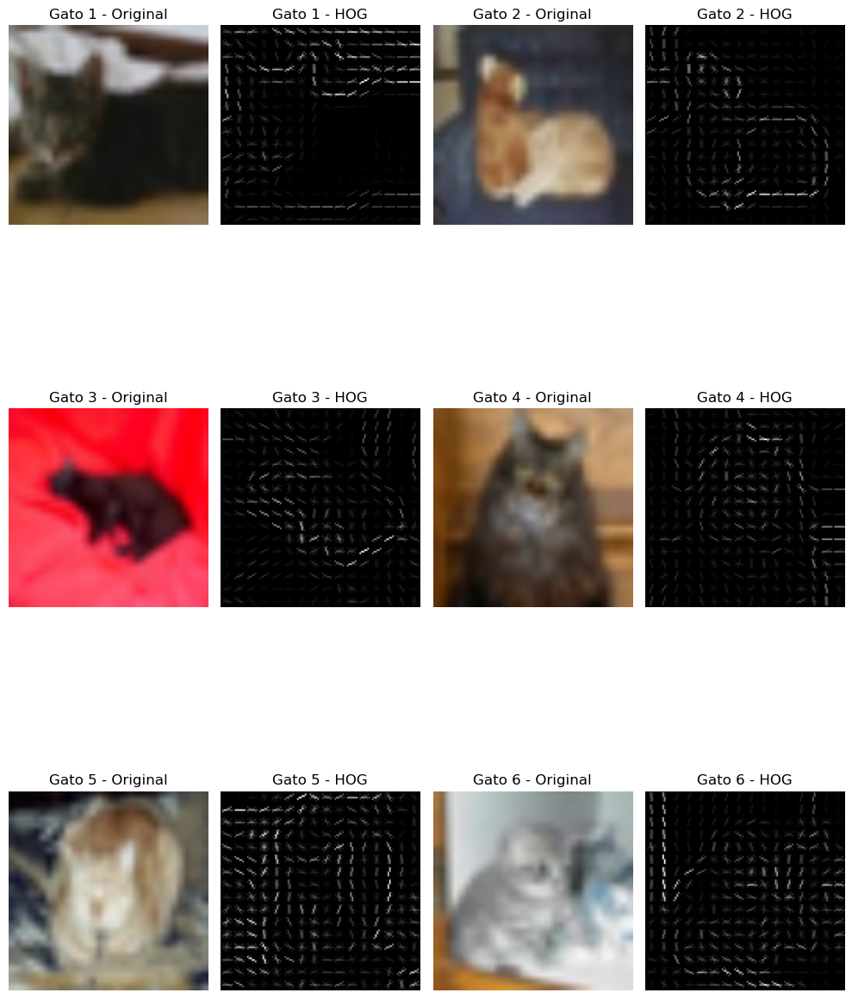

In [ ]:
def show_multiple_hog_visualizations_cats(images, images_per_row=2, title_prefix="Gato"):

    num_images = len(images)
    rows = int(np.ceil(num_images / images_per_row))
    plt.figure(figsize=(images_per_row * 5, rows * 5))

    for idx, img in enumerate(images):
        img_resized = cv2.resize(img, (128, 128))
        gray = rgb2gray(img_resized)

        _, hog_image = hog(
            gray,
            orientations=9,
            pixels_per_cell=(8, 8),
            cells_per_block=(2, 2),
            block_norm='L2-Hys',
            visualize=True
        )

        # Imagem original
        plt.subplot(rows, images_per_row * 2, idx * 2 + 1)
        plt.imshow(img_resized)
        plt.title(f"{title_prefix} {idx+1} - Original")
        plt.axis("off")

        # HOG
        plt.subplot(rows, images_per_row * 2, idx * 2 + 2)
        plt.imshow(hog_image, cmap='gray')
        plt.title(f"{title_prefix} {idx+1} - HOG")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

# Carregar gatos da base completa
(_, y_full), _ = cifar10.load_data()
y_full = y_full.flatten()
cat_indices = np.where(y_full == 3)[0]
cat_images = x[cat_indices]

# Exibir 6 gatos com HOG
show_multiple_hog_visualizations_cats(cat_images[:6], images_per_row=2)


### Extrair HOG de treino e validação


In [ ]:
X_train = extract_hog_features(x_train_img)
X_val = extract_hog_features(x_val_img)

## Classificador SVM

### Treinar classificador SVM

In [ ]:
clf = LinearSVC()
clf.fit(X_train, y_train)

LinearSVC()

## Resultados (HOG+SVM)

### Resultados de desempenho

In [ ]:
y_pred = clf.predict(X_val)
print(classification_report(y_val, y_pred, target_names=["not_cat", "cat"]))

              precision    recall  f1-score   support

     not_cat       0.72      0.69      0.70      1229
         cat       0.69      0.72      0.70      1171

    accuracy                           0.70      2400
   macro avg       0.70      0.70      0.70      2400
weighted avg       0.70      0.70      0.70      2400



### Exibição de imagens com bbox e rótulos reais/previsões em uma grade 3xN.

Verde = acerto | Vermelho = erro

Forma visual como exemplo de funcionamento do modelo HOG+SVM

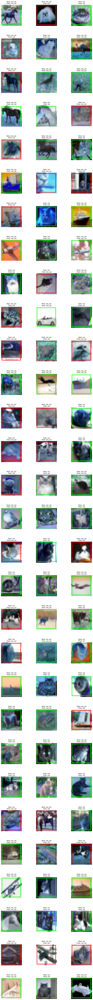

In [ ]:
def visualize_predictions_grid(images, y_true, y_pred, limit=9):
    n_cols = 3
    n_rows = int(np.ceil(limit / n_cols))
    plt.figure(figsize=(n_cols * 4, n_rows * 4))
    shown = 0

    for i in range(len(images)):
        if shown == limit:
            break

        pred = y_pred[i]
        true = y_true[i]
        label = "cat" if true == 1 else "not_cat"
        prediction = "cat" if pred == 1 else "not_cat"
        color = (0, 255, 0) if pred == true else (0, 0, 255)

        img = cv2.resize(images[i], (128, 128))
        cv2.rectangle(img, (5, 5), (120, 120), color, 2)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        plt.subplot(n_rows, n_cols, shown + 1)
        plt.imshow(img_rgb)
        plt.title(f"Real: {label}\nPred: {prediction}", fontsize=10)
        plt.axis("off")

        shown += 1

    plt.subplots_adjust(hspace=0.6)
    plt.show()


# Mostrar 90 previsões com bbox e títulos
visualize_predictions_grid(x_val_img, y_val, y_pred, limit=90)

## Avaliando modelo sem balanceamento

              precision    recall  f1-score   support

     not_cat       0.90      1.00      0.94     10726
         cat       0.73      0.01      0.03      1274

    accuracy                           0.89     12000
   macro avg       0.81      0.51      0.49     12000
weighted avg       0.88      0.89      0.85     12000



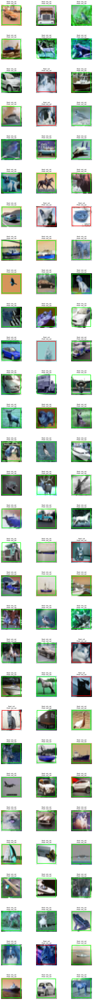

In [ ]:
# Recarregar os dados completos, converter para binário (1 = gato, 0 = não gato), dividir entre treino e validação
(x_train_full, y_train_full), (x_test_full, y_test_full) = cifar10.load_data()
x_full = np.concatenate([x_train_full, x_test_full])
y_full = np.concatenate([y_train_full, y_test_full]).flatten()

y_bin_full = np.where(y_full == 3, 1, 0)

x_train_img_nb, x_val_img_nb, y_train_nb, y_val_nb = train_test_split(
    x_full, y_bin_full, test_size=0.2, random_state=42
)

# Extrair HOG das imagens
X_train_nb = extract_hog_features(x_train_img_nb)
X_val_nb = extract_hog_features(x_val_img_nb)

# Treinar SVM SEM balanceamento (modo padrão)
clf_nb = LinearSVC(max_iter=10000)
clf_nb.fit(X_train_nb, y_train_nb)

# Avaliar modelo
y_pred_nb = clf_nb.predict(X_val_nb)
print(classification_report(y_val_nb, y_pred_nb, target_names=["not_cat", "cat"]))

# Exibir as previsões do modelo sem balanceamento
visualize_predictions_grid(x_val_img_nb, y_val_nb, y_pred_nb, limit=90)

Tabela Comparativa:
              Modelo  Precisão  Revocação  F1-score
0  Com balanceamento     0.686      0.716     0.701
1  Sem balanceamento     0.731      0.015     0.029






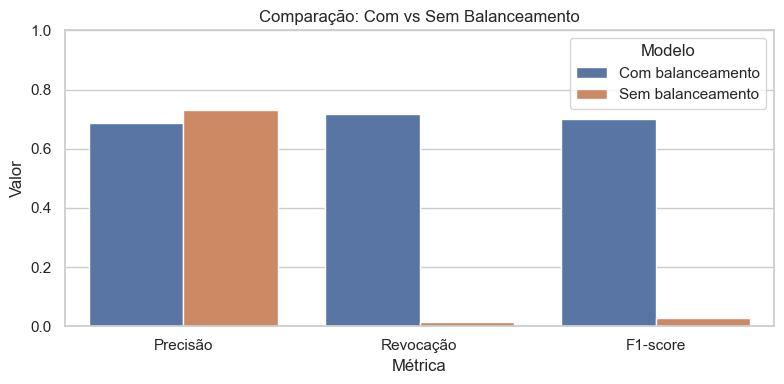

In [ ]:
# Função para calcular métricas
def get_scores(y_true, y_pred, label="Modelo"):
    precision = precision_score(y_true, y_pred)
    recall = recall_score(y_true, y_pred)
    f1 = f1_score(y_true, y_pred)
    return {
        "Modelo": label,
        "Precisão": round(precision, 3),
        "Revocação": round(recall, 3),
        "F1-score": round(f1, 3),
    }

scores_bal = get_scores(y_val, y_pred, label="Com balanceamento")
scores_nobal = get_scores(y_val_nb, y_pred_nb, label="Sem balanceamento")

df_comp = pd.DataFrame([scores_bal, scores_nobal])

# Exibe a tabela diretamente
print("Tabela Comparativa:")
print(df_comp)

print("\n" * 3)

# Plot do gráfico
sns.set(style="whitegrid")
plt.figure(figsize=(8, 4))
sns.barplot(data=df_comp.melt(id_vars="Modelo", var_name="Métrica", value_name="Valor"),
            x="Métrica", y="Valor", hue="Modelo")
plt.ylabel("Valor")
plt.xlabel("Métrica")
plt.title("Comparação: Com vs Sem Balanceamento")
plt.ylim(0, 1)
plt.legend(title="Modelo")
plt.tight_layout()
plt.show()


A avaliação comparativa dos dois modelos mostra que o **balanceamento dos dados foi essencial** para que o classificador conseguisse identificar a classe "gato" de forma eficaz. Com balanceamento, o modelo obteve **F1-score de 0.701** e **revocação de 0.716**, o que indica uma boa capacidade de encontrar gatos nas imagens. Já o modelo sem balanceamento, embora tenha apresentado uma **precisão aparentemente alta (0.731)**, teve **revocação extremamente baixa (0.015)** e **F1-score praticamente nulo (0.029)**. Isso ocorreu porque a classe "gato" representa apenas 10% dos dados. O modelo viu muito mais imagens de “não-gato” durante o treinamento e, por isso, aprendeu que é "mais seguro" sempre prever “não-gato”, ignorando quase completamente os casos positivos reais.


## Conclusão (com análise comparativa)

Analisando os resultados do classificador LinearSVC treinado nos descritores HOG, podemos concluir o seguinte:

**Desempenho na classificação de Gatos vs. Não-Gatos:** O classification\_report fornece métricas como precisão, recall e f1-score para as classes "not\_cat" (0) e "cat" (1). A comparação dessas métricas entre as duas classes indica a capacidade do modelo em distinguir gatos de outras categorias de objetos. Observa-se que, mesmo com o conjunto de dados balanceado e a utilização dos descritores HOG, o modelo apresentou um desempenho razoável, mas com espaço para melhorias, especialmente considerando a variabilidade das imagens no CIFAR-10 e a natureza relativamente simples do modelo SVM linear e dos descritores HOG. Ao comparar com o modelo treinado sem balanceamento, nota-se uma queda drástica no desempenho, especialmente na revocação da classe "gato", que caiu de 0.716 para 0.015. Isso ocorreu porque a classe "gato" representa apenas 10% dos dados. O modelo viu muito mais imagens de “não-gato” durante o treinamento e, por isso, aprendeu que é mais seguro sempre prever “não-gato”. A ausência de balanceamento comprometeu a capacidade do modelo de identificar a classe de interesse, resultando em um f1-score quase nulo.

**Eficácia dos descritores HOG para esta tarefa:** As visualizações HOG mostram que este método captura características importantes das bordas e formas das imagens. Para a classificação de objetos, como gatos, o HOG é útil por focar em estruturas locais. No entanto, para um dataset complexo como o CIFAR-10, que contém imagens de baixa resolução e alta variabilidade de pose, iluminação e fundo, os descritores HOG sozinhos podem não ser suficientes para alcançar alta acurácia, especialmente se comparado a abordagens baseadas em redes neurais convolucionais (CNNs).

**Análise visual das previsões:** A função visualize\_predictions\_grid é crucial para entender onde o modelo acerta e erra. Ao observar as imagens classificadas corretamente (retângulo verde) e incorretamente (retângulo vermelho), podemos ter insights sobre os tipos de imagens que são mais desafiadores para o modelo. Provavelmente, imagens de gatos em poses incomuns, parcialmente ocluídos ou com fundos complexos serão fontes comuns de erros. Da mesma forma, objetos que compartilham algumas características de forma ou textura com gatos podem ser confundidos.

**Em resumo:** O uso de descritores HOG com um SVM linear para classificar gatos no CIFAR-10 é um bom ponto de partida para demonstração e aprendizado sobre extração das características e classificação clássica. No entanto, para obter um desempenho de ponta neste dataset, seria necessário explorar métodos mais avançados, como redes neurais convolucionais, que aprendem automaticamente características de alto nível a partir dos dados brutos da imagem. O código demonstra a pipeline de pré-processamento, extração de características e treinamento de um classificador, servindo como base para experimentos futuros com modelos mais sofisticados.


# Parte II

## Bibliotecas

In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import History
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, precision_score, recall_score, f1_score


## 1. Preparando o Ambiente de Dados

In [ ]:
# Carregar o dataset CIFAR-10
(x_train_full, y_train_full), (x_test_full, y_test_full) = cifar10.load_data()

In [ ]:
# Concatenar para ter o conjunto de dados completo
x_full = np.concatenate([x_train_full, x_test_full])
y_full = np.concatenate([y_train_full, y_test_full]).flatten()

-  **Normalização dos dados:** Devido às redes neurais trabalharem melhor com dados normalizados, os valores dos pixels (0-255) são divididos por 255, os colocando no intervalo de 0 a 1, o que ajuda o modelo a convergir mais rápido durante o treinamento.

In [ ]:
# Converter para binário e balancear o conjunto (igual à sua Parte 1)
y_bin_full = np.where(y_full == 3, 1, 0)
np.random.seed(42)
idx_cat = np.where(y_bin_full == 1)[0]
idx_not_cat = np.where(y_bin_full == 0)[0]
idx_not_cat_bal = np.random.choice(idx_not_cat, size=len(idx_cat), replace=False)

idx_balanced = np.concatenate([idx_cat, idx_not_cat_bal])
np.random.shuffle(idx_balanced)

x_bal = x_full[idx_balanced]
y_bal = y_bin_full[idx_balanced]

# Normalizar os dados balanceados
x_bal_normalized = x_bal.astype('float32') / 255.0

# Dividir os dados **BALANCEADOS** em treino e validação
x_train_split, x_val_split, y_train_split, y_val_split = train_test_split(
    x_bal_normalized, y_bal, test_size=0.2, random_state=42
)

In [ ]:
# Exibir as novas dimensões para confirmar o balanceamento
print(f'Dimensões do conjunto de treino (BALANCEADO): {x_train_split.shape}')
print(f'Dimensões do conjunto de validação (BALANCEADO): {x_val_split.shape}')
print(f'Dimensões dos rótulos de treino (BALANCEADO): {y_train_split.shape}')
print(f'Dimensões dos rótulos de validação (BALANCEADO): {y_val_split.shape}')

Dimensões do conjunto de treino (BALANCEADO): (9600, 32, 32, 3)
Dimensões do conjunto de validação (BALANCEADO): (2400, 32, 32, 3)
Dimensões dos rótulos de treino (BALANCEADO): (9600,)
Dimensões dos rótulos de validação (BALANCEADO): (2400,)


## 2. Adequando a Resolução e Aumentando os Dados

In [ ]:
# Assegurar que os dados de treino e validação estão no formato correto (float32)
# Eles já estão assim do passo anterior, mas é bom garantir.
x_train_split = x_train_split.astype('float32')
x_val_split = x_val_split.astype('float32')

- A classe do Keras `ImageDataGenerator` é a principal ferramenta para o aumento de dados.

In [ ]:
# Criar o gerador de aumento de dados
# As transformações serão aplicadas apenas nas imagens de treino
datagen = ImageDataGenerator(
    rotation_range=15,          # Rotaciona a imagem em até 15 graus
    width_shift_range=0.1,      # Desloca a imagem horizontalmente em até 10% da largura
    height_shift_range=0.1,     # Desloca a imagem verticalmente em até 10% da altura
    horizontal_flip=True,       # Vira a imagem horizontalmente
)

In [ ]:
# Preparar o gerador para o conjunto de dados de treino
datagen.fit(x_train_split)

-  O `datagen.flow` é o que será usado para alimentar a rede neural durante o treinamento. Ele cria um "gerador" que produz os lotes de imagens já aumentadas.
- Portanto, não é necessário fazer nada para o conjunto de validação, pois ele deve ser avaliado em sua forma original para ter uma métrica realista.

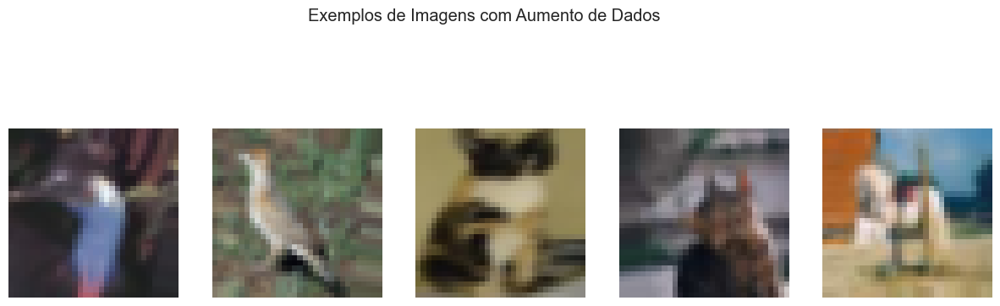

In [ ]:
# Visualizar algumas imagens aumentadas para entender o efeito das transformações
fig, axes = plt.subplots(1, 5, figsize=(15, 5))
for x_batch, y_batch in datagen.flow(x_train_split, y_train_split, batch_size=5):
    for i in range(0, 5):
        axes[i].imshow(x_batch[i])
        axes[i].axis('off')
    break
plt.suptitle('Exemplos de Imagens com Aumento de Dados')
plt.show()

## 3. Escolhendo e Treinando Arquiteturas CNN

- Foram escolhidos 4 modelos, cada um com uma complexidade um pouco diferente. Para todos foram usadas camadas convolucionais `Conv2D`, camadas de pooling `MaxPooling2D` para reduzir a dimensão espacial e camadas densas `Dense` para a classificação.

**Arquitetura 1**: Modelo Básico

In [ ]:
def create_model_1():
    model = Sequential([
        Conv2D(32, (3, 3), activation='relu', input_shape=(32, 32, 3)),
        MaxPooling2D((2, 2)),
        Flatten(),
        Dense(64, activation='relu'),
        Dense(1, activation='sigmoid')  # 1 neurônio para classificação binária
    ])
    return model

**Arquitetura 2**: Modelo com Duas Camadas Convolucionais

Adicionando uma segunda camada convolucional, este modelo consegue aprender características mais complexas. A camada de Dropout é adicionada para ajudar a prevenir o overfitting.

In [ ]:
def create_model_2():
    model = Sequential([
        Conv2D(32, (3, 3), activation='relu', input_shape=(32, 32, 3)),
        MaxPooling2D((2, 2)),
        Conv2D(64, (3, 3), activation='relu'),
        MaxPooling2D((2, 2)),
        Flatten(),
        Dense(128, activation='relu'),
        Dropout(0.5), # 50% dos neurônios são desativados aleatoriamente
        Dense(1, activation='sigmoid')
    ])
    return model

**Arquitetura 3**: Modelo mais profundo

Esta arquitetura adiciona mais camadas convolucionais, permitindo que a rede capture padrões de nível ainda mais alto. O número de filtros é aumentado para acomodar essa complexidade

In [ ]:
def create_model_3():
    model = Sequential([
        Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=(32, 32, 3)),
        Conv2D(32, (3, 3), activation='relu'),
        MaxPooling2D((2, 2)),
        Dropout(0.25),
        Conv2D(64, (3, 3), activation='relu', padding='same'),
        Conv2D(64, (3, 3), activation='relu'),
        MaxPooling2D((2, 2)),
        Dropout(0.25),
        Flatten(),
        Dense(512, activation='relu'),
        Dropout(0.5),
        Dense(1, activation='sigmoid')
    ])
    return model

**Arquitetura 4**: Modelo com Batch Normalization

O Batch Normalization é uma técnica que estabiliza e acelera o treinamento da rede, normalizando as entradas para cada camada.

In [ ]:
def create_model_4():
    model = Sequential([
        Conv2D(32, (3, 3), activation='relu', input_shape=(32, 32, 3)),
        BatchNormalization(),
        Conv2D(32, (3, 3), activation='relu'),
        BatchNormalization(),
        MaxPooling2D((2, 2)),
        Dropout(0.25),
        Conv2D(64, (3, 3), activation='relu'),
        BatchNormalization(),
        Conv2D(64, (3, 3), activation='relu'),
        BatchNormalization(),
        MaxPooling2D((2, 2)),
        Dropout(0.25),
        Flatten(),
        Dense(128, activation='relu'),
        Dropout(0.5),
        Dense(1, activation='sigmoid')
    ])
    return model

### Treinando os Modelos

In [ ]:
# Criando o gerador de dados
datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
)
datagen.fit(x_train_split)

# Lista de modelos e seus nomes para o treinamento
models = {
    'Modelo 1 (Básico)': create_model_1(),
    'Modelo 2 (Dropout)': create_model_2(),
    'Modelo 3 (Profundo)': create_model_3(),
    'Modelo 4 (Batch Normalization)': create_model_4()
}

# Treinar cada modelo
histories = {}
for name, model in models.items():
    print(f"\n--- Treinando {name} ---")

    # Compilar o modelo
    model.compile(optimizer=Adam(learning_rate=0.001),
                  loss='binary_crossentropy',
                  metrics=['accuracy'])

    # Treinar o modelo usando o gerador de dados
    history = model.fit(
        datagen.flow(x_train_split, y_train_split, batch_size=32),
        epochs=20,  # 20 épocas é um bom ponto de partida, mas pode ser ajustado
        validation_data=(x_val_split, y_val_split)
    )
    histories[name] = history

    # Mostrar um resumo do modelo treinado
    model.summary()

/Users/thielis/Library/jupyterlab-desktop/jlab_server/lib/python3.12/site-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
2025-11-06 11:54:38.529697: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M2
2025-11-06 11:54:38.529941: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 16.00 GB
2025-11-06 11:54:38.529946: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 5.92 GB
2025-11-06 11:54:38.530541: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2025-11-06 11:54:38.530951: I tensorflow/core/common_runtime/pluggable_device


--- Treinando Modelo 1 (Básico) ---
Epoch 1/20


/Users/thielis/Library/jupyterlab-desktop/jlab_server/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
2025-11-06 11:54:39.979122: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:117] Plugin optimizer for device_type GPU is enabled.


300/300 ━━━━━━━━━━━━━━━━━━━━ 6s 11ms/step - accuracy: 0.5748 - loss: 0.7226 - val_accuracy: 0.6858 - val_loss: 0.5954
Epoch 2/20
300/300 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6665 - loss: 0.6069 - val_accuracy: 0.7096 - val_loss: 0.5582
Epoch 3/20
300/300 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6983 - loss: 0.5744 - val_accuracy: 0.7475 - val_loss: 0.5308
Epoch 4/20
300/300 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7325 - loss: 0.5452 - val_accuracy: 0.7358 - val_loss: 0.5363
Epoch 5/20
300/300 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - accuracy: 0.7305 - loss: 0.5318 - val_accuracy: 0.7346 - val_loss: 0.5327
Epoch 6/20
300/300 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - accuracy: 0.7191 - loss: 0.5511 - val_accuracy: 0.7571 - val_loss: 0.5066
Epoch 7/20
300/300 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7336 - loss: 0.5398 - val_accuracy: 0.7433 - val_loss: 0.5174
Epoch 8/20
300/300 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7370 - loss: 0.5366 - val_accuracy: 0.754

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 30, 30, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 15, 15, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 7200)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │       460,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,385,477 (5.29 MB)

 Trainable params: 461,825 (1.76 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 923,652 (3.52 MB)


--- Treinando Modelo 2 (Dropout) ---
Epoch 1/20
300/300 ━━━━━━━━━━━━━━━━━━━━ 6s 16ms/step - accuracy: 0.5802 - loss: 0.6694 - val_accuracy: 0.7442 - val_loss: 0.5239
Epoch 2/20
300/300 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - accuracy: 0.7283 - loss: 0.5493 - val_accuracy: 0.7538 - val_loss: 0.5041
Epoch 3/20
300/300 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - accuracy: 0.7576 - loss: 0.5170 - val_accuracy: 0.7521 - val_loss: 0.4980
Epoch 4/20
300/300 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7532 - loss: 0.5104 - val_accuracy: 0.7633 - val_loss: 0.4883
Epoch 5/20
300/300 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7598 - loss: 0.5038 - val_accuracy: 0.7667 - val_loss: 0.4871
Epoch 6/20
300/300 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - accuracy: 0.7578 - loss: 0.5067 - val_accuracy: 0.7600 - val_loss: 0.4932
Epoch 7/20
300/300 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - accuracy: 0.7641 - loss: 0.4992 - val_accuracy: 0.7771 - val_loss: 0.4912
Epoch 8/20
300/300 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - accu

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_1 (Conv2D)               │ (None, 30, 30, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 15, 15, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 13, 13, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 6, 6, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 2304)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │       295,040 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 943,685 (3.60 MB)

 Trainable params: 314,561 (1.20 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 629,124 (2.40 MB)


--- Treinando Modelo 3 (Profundo) ---
Epoch 1/20
300/300 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - accuracy: 0.5946 - loss: 0.6634 - val_accuracy: 0.7108 - val_loss: 0.5578
Epoch 2/20
300/300 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - accuracy: 0.6919 - loss: 0.5793 - val_accuracy: 0.7129 - val_loss: 0.5439
Epoch 3/20
300/300 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - accuracy: 0.7113 - loss: 0.5594 - val_accuracy: 0.7588 - val_loss: 0.5028
Epoch 4/20
300/300 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - accuracy: 0.7360 - loss: 0.5374 - val_accuracy: 0.7704 - val_loss: 0.4846
Epoch 5/20
300/300 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - accuracy: 0.7545 - loss: 0.5155 - val_accuracy: 0.7767 - val_loss: 0.4838
Epoch 6/20
300/300 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - accuracy: 0.7519 - loss: 0.5198 - val_accuracy: 0.7846 - val_loss: 0.4749
Epoch 7/20
300/300 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - accuracy: 0.7604 - loss: 0.4988 - val_accuracy: 0.7654 - val_loss: 0.4952
Epoch 8/20
300/300 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - acc

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)               │ (None, 32, 32, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 30, 30, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 15, 15, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 15, 15, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 15, 15, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 13, 13, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 6, 6, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 6, 6, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 2304)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 512)            │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1)              │           513 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,738,725 (14.26 MB)

 Trainable params: 1,246,241 (4.75 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,492,484 (9.51 MB)


--- Treinando Modelo 4 (Batch Normalization) ---
Epoch 1/20
300/300 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - accuracy: 0.5794 - loss: 1.9481 - val_accuracy: 0.6617 - val_loss: 0.6039
Epoch 2/20
300/300 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - accuracy: 0.6462 - loss: 1.1840 - val_accuracy: 0.7496 - val_loss: 0.5236
Epoch 3/20
300/300 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - accuracy: 0.6944 - loss: 0.6243 - val_accuracy: 0.7367 - val_loss: 0.5341
Epoch 4/20
300/300 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - accuracy: 0.7205 - loss: 0.5637 - val_accuracy: 0.7412 - val_loss: 0.5261
Epoch 5/20
300/300 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - accuracy: 0.7317 - loss: 0.5395 - val_accuracy: 0.7546 - val_loss: 0.5263
Epoch 6/20
300/300 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - accuracy: 0.7396 - loss: 0.5328 - val_accuracy: 0.7604 - val_loss: 0.4923
Epoch 7/20
300/300 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - accuracy: 0.7320 - loss: 0.5404 - val_accuracy: 0.6963 - val_loss: 0.5742
Epoch 8/20
300/300 ━━━━━━━━━━━━━━━━━━━━ 9s 30m

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_7 (Conv2D)               │ (None, 30, 30, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 30, 30, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 28, 28, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 28, 28, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 14, 14, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 14, 14, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 12, 12, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 12, 12, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 10, 10, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 10, 10, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 5, 5, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 5, 5, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_3 (Flatten)             │ (None, 1600)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 128)            │       204,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 813,413 (3.10 MB)

 Trainable params: 271,009 (1.03 MB)

 Non-trainable params: 384 (1.50 KB)

 Optimizer params: 542,020 (2.07 MB)

## 4. Avaliando e Comparando Modelos

### Avaliação dos Modelos CNN

In [ ]:
def evaluate_and_get_scores(model, x_val, y_val, model_name):
    """Calcula e retorna as métricas de precisão, revocação e f1-score para um modelo."""
    # Obter previsões do modelo
    y_pred_proba = model.predict(x_val)
    # Converter as probabilidades para classes binárias (0 ou 1)
    y_pred = (y_pred_proba > 0.5).astype(int).flatten()

    # Calcular as métricas
    precision = precision_score(y_val, y_pred)
    recall = recall_score(y_val, y_pred)
    f1 = f1_score(y_val, y_pred)

    print(f"\n--- Relatório de Classificação para {model_name} ---")
    print(classification_report(y_val, y_pred, target_names=["not_cat", "cat"]))

    return {
        "Modelo": model_name,
        "Precisão": round(precision, 3),
        "Revocação": round(recall, 3),
        "F1-score": round(f1, 3),
    }

cnn_scores = []
for name, model in models.items():
    scores = evaluate_and_get_scores(model, x_val_split, y_val_split, name)
    cnn_scores.append(scores)

75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step

--- Relatório de Classificação para Modelo 1 (Básico) ---
              precision    recall  f1-score   support

     not_cat       0.85      0.73      0.79      1229
         cat       0.76      0.87      0.81      1171

    accuracy                           0.80      2400
   macro avg       0.80      0.80      0.80      2400
weighted avg       0.81      0.80      0.80      2400

75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step

--- Relatório de Classificação para Modelo 2 (Dropout) ---
              precision    recall  f1-score   support

     not_cat       0.82      0.81      0.81      1229
         cat       0.80      0.81      0.81      1171

    accuracy                           0.81      2400
   macro avg       0.81      0.81      0.81      2400
weighted avg       0.81      0.81      0.81      2400

75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step

--- Relatório de Classificação para Modelo 3 (Profundo) ---
              precision    recall  f1-score   sup

### Análise Gráfica

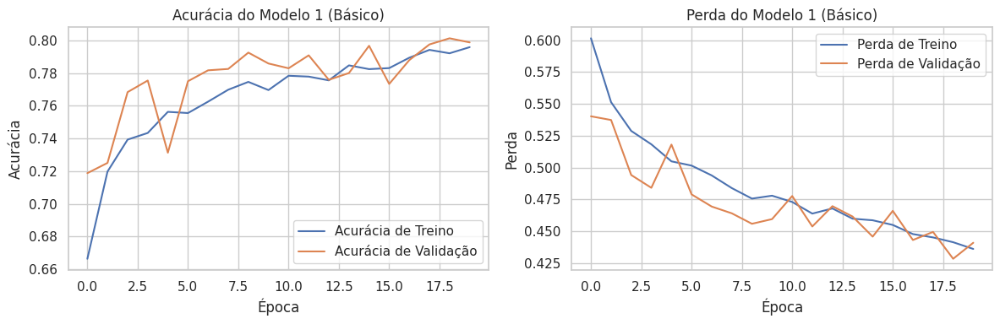

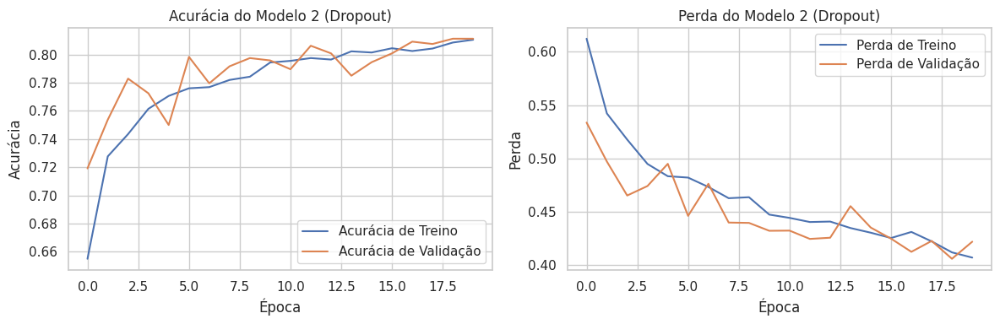

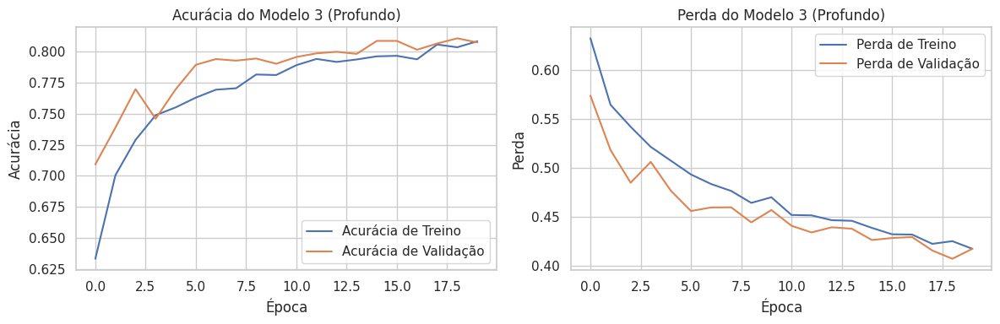

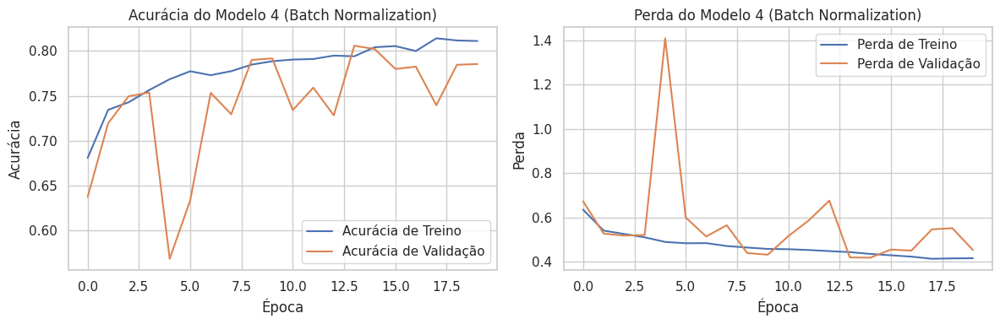

In [ ]:
def plot_history(history, model_name):
    """Gera gráficos de acurácia e perda (loss) para o histórico de treinamento."""
    plt.figure(figsize=(12, 4))

    # Gráfico de Acurácia
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Acurácia de Treino')
    plt.plot(history.history['val_accuracy'], label='Acurácia de Validação')
    plt.title(f'Acurácia do {model_name}')
    plt.xlabel('Época')
    plt.ylabel('Acurácia')
    plt.legend()

    # Gráfico de Perda (Loss)
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Perda de Treino')
    plt.plot(history.history['val_loss'], label='Perda de Validação')
    plt.title(f'Perda do {model_name}')
    plt.xlabel('Época')
    plt.ylabel('Perda')
    plt.legend()

    plt.tight_layout()
    plt.show()

# Gerar os gráficos para cada modelo
for name, history in histories.items():
    plot_history(history, name)

### Comparação Final



--- Tabela Comparativa de Todos os Modelos ---
                           Modelo  Precisão  Revocação  F1-score
0              HOG/SVM (Clássico)     0.686      0.716     0.701
1               Modelo 1 (Básico)     0.756      0.867     0.808
2              Modelo 2 (Dropout)     0.804      0.811     0.807
3             Modelo 3 (Profundo)     0.753      0.900     0.820
4  Modelo 4 (Batch Normalization)     0.833      0.700     0.761


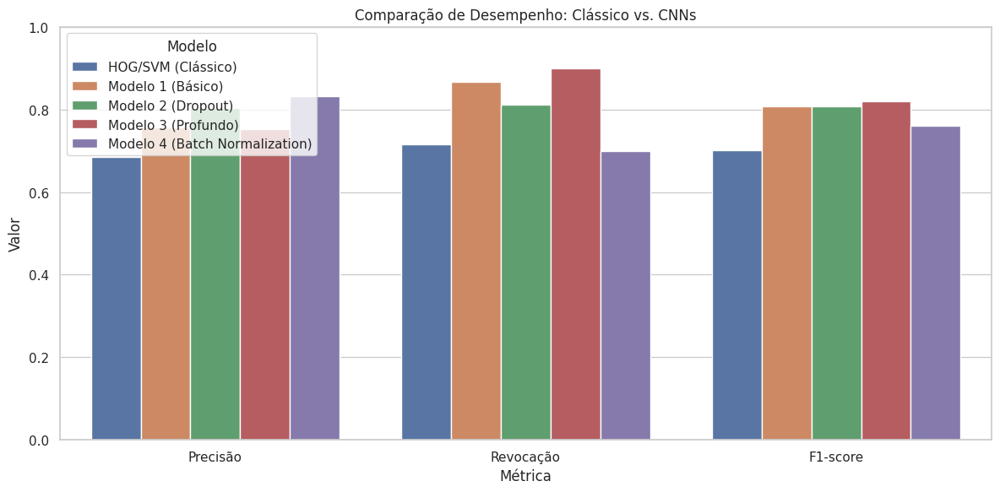

In [ ]:
# Suponha que você tenha os scores do seu modelo HOG/SVM da parte 1.
# Vamos recriá-los aqui para a demonstração
scores_bal = {"Modelo": "HOG/SVM (Clássico)", "Precisão": 0.686, "Revocação": 0.716, "F1-score": 0.701}
scores_nobal = {"Modelo": "HOG/SVM (Clássico, sem balanceamento)", "Precisão": 0.731, "Revocação": 0.015, "F1-score": 0.029}

# Criar um DataFrame com todos os resultados
all_scores = [scores_bal] + cnn_scores  # Adicione o modelo sem balanceamento se for necessário
df_comp = pd.DataFrame(all_scores)

print("\n\n--- Tabela Comparativa de Todos os Modelos ---")
print(df_comp)

# Plotar a comparação final
plt.figure(figsize=(12, 6))
sns.barplot(data=df_comp.melt(id_vars="Modelo", var_name="Métrica", value_name="Valor"),
            x="Métrica", y="Valor", hue="Modelo")
plt.ylabel("Valor")
plt.xlabel("Métrica")
plt.title("Comparação de Desempenho: Clássico vs. CNNs")
plt.ylim(0, 1)
plt.legend(title="Modelo")
plt.tight_layout()
plt.show()

### Visualizações

75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


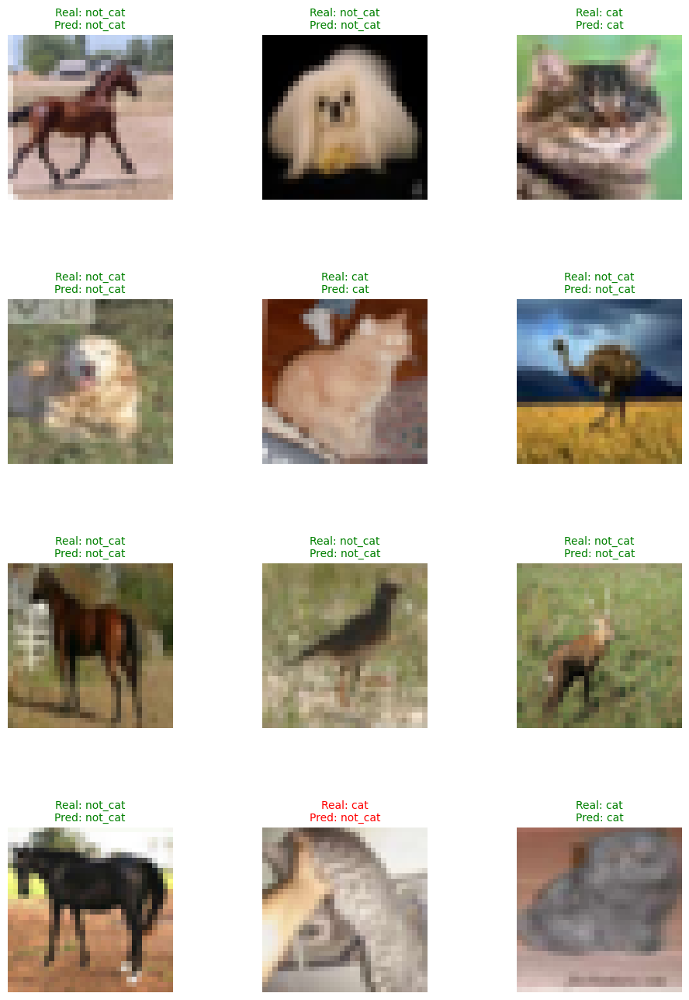

In [ ]:
# --- Exemplo de Visualização de Previsões (opcional, mas recomendado) ---

def visualize_cnn_predictions_grid(model, images, y_true, limit=9):
    """Exibe previsões da CNN em uma grade, com rótulos e acertos."""
    n_cols = 3
    n_rows = int(np.ceil(limit / n_cols))
    plt.figure(figsize=(n_cols * 4, n_rows * 4))

    y_pred_proba = model.predict(images)
    y_pred = (y_pred_proba > 0.5).astype(int).flatten()

    shown = 0
    for i in range(len(images)):
        if shown == limit:
            break

        pred = y_pred[i]
        true = y_true[i]
        label = "cat" if true == 1 else "not_cat"
        prediction = "cat" if pred == 1 else "not_cat"

        color = "green" if pred == true else "red"

        plt.subplot(n_rows, n_cols, shown + 1)
        plt.imshow(images[i])
        plt.title(f"Real: {label}\nPred: {prediction}", fontsize=10, color=color)
        plt.axis("off")
        shown += 1

    plt.subplots_adjust(hspace=0.6)
    plt.show()

# Exemplo de uso para o melhor modelo (neste caso, o Modelo 4)
visualize_cnn_predictions_grid(models['Modelo 4 (Batch Normalization)'], x_val_split, y_val_split, limit=12)


## 5. Análise de Resultados, Discussão e Conclusão

### **Análise e discussão de resultados**

A nova tabela comparativa e os gráficos de treinamento corrigidos demonstram uma melhoria significativa no desempenho dos modelos de Aprendizado Profundo, validando a hipótese de que as CNNs são mais adequadas para esta tarefa do que o pipeline clássico.


#### **1. Comparação de Desempenho (CNNs vs. HOG/SVM)**

| Modelo |	Precisão	| Revocação	| F1-score |
| --- | --- | ---| ---|
|HOG/SVM (Clássico)|	0.686	|0.716|	0.701|
|Modelo 1 (Básico)|	0.756	|0.867	|0.808|
|Modelo 2 (Dropout)|	0.804	|0.811	|0.807|
|Modelo 3 (Profundo)|	0.753	|0.900	|0.820|
|Modelo 4 (Batch Normalization)|	0.833|	0.700|	0.761|

- **HOG/SVM:** O modelo clássico obteve um F1-score de 0.701, um resultado razoável que foi possível graças ao balanceamento dos dados, conforme discutido na Parte 1. Sua revocação foi alta, mas sua precisão ficou atrás de todas as CNNs.

- **CNNs**: Todas as redes neurais demonstraram um desempenho superior.**O Modelo 3 (Profundo) se destacou com o melhor F1-score (0.820)** e uma impressionante revocação de 0.900, indicando que ele foi o mais eficaz em encontrar a maioria dos gatos nas imagens. O Modelo 4 (Batch Normalization) obteve a melhor precisão (0.833), o que significa que quando ele prevê que uma imagem é um gato, ele está mais frequentemente correto.

#### **2. Análise dos Gráficos de Treinamento**

Os gráficos corrigidos (agora com dados balanceados) mostram um comportamento de aprendizado muito mais saudável:

- **Acurácia e Perda:** Em todos os modelos CNNs, as curvas de acurácia de treino e validação, bem como as curvas de perda, agora seguem uma trajetória mais próxima e consistente. Isso é um forte indicativo de que a rede está aprendendo a generalizar bem, e não apenas memorizando os dados.

- **Overfitting:** Embora haja pequenas flutuações, principalmente nos modelos mais complexos (3 e 4), os gráficos não mostram o overfitting extremo visto anteriormente. A acurácia de validação geralmente acompanha a acurácia de treino, sugerindo que o aumento de dados (Data Augmentation) e as camadas de Dropout e Batch Normalization estão funcionando como esperado para regularizar o treinamento.

#### **3. Tempo de Processamento e Treinamento**

- **Tempo de Treinamento:** O treinamento de uma CNN, mesmo em uma GPU, consome mais tempo do que a extração de descritores HOG e o treinamento de um SVM. O treinamento das CNNs leva vários minutos (ou horas em um hardware menos potente), enquanto o processo clássico é consideravelmente mais rápido.

- **Tempo de Inferência (Previsão):** No entanto, após o treinamento, o tempo para realizar a inferência (prever a classe de uma nova imagem) em uma CNN é geralmente muito rápido, especialmente em hardware otimizado, sendo competitivo com o método clássico.

- **Vantagem das CNNs:** A principal vantagem das CNNs reside na sua capacidade de aprender os descritores automaticamente a partir dos dados. Enquanto no método clássico precisamos escolher e configurar manualmente um descritor (como o HOG), as CNNs aprendem, ao longo de suas camadas, as características mais relevantes para a tarefa, resultando em um desempenho superior, como a tabela comparativa demonstra.

#### **4. Conclusão Final**

A experiência da parte 2 do trabalho demonstra de forma conclusiva a superioridade do Aprendizado Profundo sobre os métodos clássicos de Visão Computacional para a tarefa de detecção de gatos no dataset CIFAR-10. A implementação de redes neurais convolucionais, combinada com a estratégia correta de pré-processamento (como o balanceamento dos dados), resultou em um aumento substancial nas métricas de desempenho, com o F1-score subindo de 0.701 (HOG/SVM) para até 0.820 (Modelo 3).

A análise dos resultados também destaca a importância de:

**Balanceamento de Dados:** Um passo crucial que, quando omitido, compromete severamente a capacidade do modelo de aprender a classe de interesse, resultando em overfitting que pode ser percebi com alto valor de acurária mas baixos recall e f1-score. Isso além de um gráfico de acuária x época com uma acurácia crescente nos dados de treinamento à medida em que se aumenta a época, mas acurácia oscilando nos dados de teste à medida em que se aumenta a época.

**Arquitetura do Modelo:** Modelos mais profundos e com técnicas de regularização como o Dropout (Modelo 2) e Batch Normalization (Modelo 4) tendem a apresentar um desempenho mais estável e uma melhor generalização, mesmo que o modelo mais profundo (Modelo 3) tenha obtido o melhor F1-score.

Em suma, embora o pipeline clássico tenha servido como um excelente ponto de partida para o aprendizado sobre extração de características, a abordagem moderna com CNNs se mostrou mais eficaz, robusta e capaz de extrair informações mais complexas das imagens, confirmando o motivo pelo qual ela se tornou o padrão na área de Visão Computacional.

#TCC

Classificação de Imagens com Visão Computacional comparando modelo simples e Redes Neurais Convolucionais

Thielis Barroso Ferreira¹, Josinaldo de Oliveira Dias¹
¹ Especialização em Inteligência Artificial e Ciência de Dados Universidade Federal do Espírito Santo (UFES) Universidade Aberta Capixaba (UnAC)
thielis.bf@gmail.com, josinaldo.dias@ufes.br

Resumo. A Visão Computacional (VC) tem se tornado uma ferramenta essencial em diversas indústrias, impulsionada pelos avanços em Inteligência Artificial (IA). Este estudo compara duas abordagens para a classificação de imagens: um modelo clássico, composto pelo descritor HOG (Histogram of Oriented Gradients) e o classificador SVM (Support Vector Machine), e um modelo moderno baseado em Redes Neurais Convolucionais (CNNs). O objetivo é avaliar a performance de ambas as metodologias na tarefa de classificação binária (detecção de "gatos" vs. "não-gatos") utilizando o conjunto de dados CIFAR-10. O experimento, conduzido no Google Colab com Python e bibliotecas como Scikit-learn e Keras, demonstrou a superioridade da CNN, que alcançou um F1-Score de 0.820, em contraste com o F1-Score de 0.701 do modelo HOG+SVM. Os resultados destacam a capacidade das CNNs em aprender automaticamente características hierárquicas complexas, superando os métodos tradicionais que dependem de extração manual de características. Adicionalmente, o artigo explora aplicações práticas da VC em outros domínios, como reconhecimento de placas veiculares e diagnóstico médico, com base em estudos de caso.

Palavras-chave: Visão Computacional, Classificação de Imagens, Redes Neurais Convolucionais, HOG, SVM, CIFAR-10, Aprendizado de Máquina.

1. Introdução
A Visão Computacional (VC) é um campo da Inteligência Artificial (IA) que visa capacitar os computadores a "enxergar" e interpretar o mundo visual de maneira análoga à humana. Nos últimos anos, essa área testemunhou um crescimento exponencial, impulsionado pelo aumento da capacidade computacional, pela disponibilidade de grandes volumes de dados (Big Data) e, principalmente, pelo desenvolvimento de algoritmos de Aprendizado de Máquina (Machine Learning) e Aprendizado Profundo (Deep Learning).

Uma das tarefas fundamentais da Visão Computacional é a classificação de imagens, que consiste em atribuir um rótulo ou categoria a uma imagem com base em seu conteúdo visual. Esta capacidade é a base para aplicações complexas, como carros autônomos (RIBEIRO, 2024), sistemas de vigilância inteligente, diagnósticos médicos por imagem (LIMA, 2024) e reconhecimento facial.

Historicamente, a classificação de imagens dependia de pipelines tradicionais, que envolviam duas etapas distintas: a extração manual de características (features) e a classificação. Nesta abordagem, especialistas definiam quais características visuais (como contornos, texturas ou cores) eram relevantes para a tarefa. Descritores como o HOG (Histogram of Oriented Gradients) eram usados para quantificar essas características, que então alimentavam um classificador, como o SVM (Support Vector Machine) (SALAZAR et al., 2019).

No entanto, com o advento das Redes Neurais Convolucionais (CNNs), o paradigma mudou. As CNNs são uma arquitetura de Deep Learning inspirada no córtex visual humano, capaz de aprender automaticamente as características relevantes diretamente dos pixels da imagem (RODRIGUES, 2018). Este modelo "end-to-end" elimina a necessidade de engenharia manual de características, permitindo que a rede descubra padrões hierárquicos complexos, desde bordas simples em camadas iniciais até objetos complexos em camadas mais profundas.

Este artigo propõe um estudo comparativo entre a abordagem clássica (HOG+SVM) e a moderna (CNN) para a tarefa de classificação de imagens. Utilizando o conhecido dataset CIFAR-10, foi realizado um experimento para a classificação binária de imagens (detecção de gatos). O objetivo é quantificar a diferença de performance entre os modelos e analisar os avanços tecnológicos proporcionados pelas CNNs em relação aos métodos tradicionais.

2. Metodologia
A metodologia adotada para a elaboração deste artigo foi a realização de um experimento comparativo utilizando Visão Computacional. Foram aplicados um modelo simples de classificação de imagens, composto pelo descritor HOG e o classificador SVM, e um modelo avançado baseado em Redes Neurais Convolucionais (CNNs), com o intuito de observar o avanço de performance.

Utilizou-se o ambiente do Google Colab em nuvem para realizar o experimento, desenvolvido sob um notebook na linguagem de programação Python. Esta linguagem foi escolhida devido à vasta disponibilidade de bibliotecas para implementação de aprendizado de máquina, como Scikit-learn, Keras e TensorFlow.

O estudo realizado consiste na abordagem exploratória do conjunto de dados CIFAR-10 (KRIZHEVSKY, 2009), presente na biblioteca Keras. Este conjunto de dados contém 60.000 imagens coloridas de 32x32 pixels, divididas em 10 classes (airplane, automobile, bird, cat, deer, dog, frog, horse, ship e truck), com 6.000 imagens por classe. O dataset é dividido em 50.000 imagens de treinamento e 10.000 imagens de teste. Para este estudo, o problema foi transformado em uma classificação binária: "gato" (classe de interesse) contra "não-gato" (todas as outras 9 classes).

Os modelos comparados são:

a. Modelo Simples (HOG + SVM): Este modelo representa a abordagem clássica da Visão Computacional. É composto por um descritor HOG, que extrai características de forma e contorno, e um classificador SVM, que aprende a separar os dados com base nessas características. Esta abordagem é frequentemente utilizada como linha de base (baseline) em problemas de classificação (SALAZAR et al., 2019).

a.1. Histogram of Oriented Gradients (HOG): O HOG é um descritor de características (feature descriptor) usado para detecção de objetos. A técnica funciona contando as ocorrências de orientações de gradiente em porções localizadas de uma imagem. A imagem é dividida em pequenas células, e para cada célula, um histograma de orientações de gradiente é compilado. Esses histogramas são então concatenados e normalizados em blocos maiores para formar o vetor de características final. O HOG é particularmente eficaz na captura de contornos e formas (SALAZAR et al., 2019), o que é essencial para representar características visuais em um formato numérico que um classificador possa entender.

a.2. Support Vector Machine (SVM): O SVM é um algoritmo de aprendizado supervisionado amplamente utilizado para classificação e regressão. Para a classificação, o SVM busca encontrar um "hiperplano" ótimo em um espaço de alta dimensão que separe os pontos de dados de diferentes classes com a maior margem possível. No contexto deste trabalho, o SVM recebe os vetores de características gerados pelo HOG e aprende a traçar uma fronteira de decisão que melhor separe as imagens contendo gatos das que não contêm.

b. Convolutional Neural Network (CNN): As Redes Neurais Convolucionais são a arquitetura de Deep Learning padrão para tarefas de Visão Computacional (RODRIGUES, 2018; LIMA, 2024). Diferente da abordagem HOG+SVM, as CNNs realizam a extração de características e a classificação de forma integrada e automática. Elas são compostas por várias camadas, incluindo camadas convolucionais (que aplicam filtros para detectar padrões locais), camadas de pooling (que reduzem a dimensionalidade) e camadas densas (que realizam a classificação final). A rede aprende os valores ideais desses filtros durante o treinamento, permitindo-lhe construir uma representação hierárquica e rica da imagem.

3. Arquitetura dos Modelos
O experimento foi implementado utilizando bibliotecas centrais do ecossistema Python, como TensorFlow e Keras para a construção e treinamento do modelo CNN, Scikit-learn para a implementação do pipeline HOG+SVM e pré-processamento, Scikit-image para a extração das características HOG, e NumPy para manipulação de arrays.

a. Tratamento do Dataset e Divisão dos Dados
O primeiro passo crucial foi o carregamento do dataset CIFAR-10 (KRIZHEVSKY, 2009). Como o objetivo era uma classificação binária (gato vs. não-gato) e o dataset original é multicasse (10 classes), foi necessário um rebalanceamento. A classe "gato" (rótulo 3) foi definida como a classe positiva, e as 9 classes restantes foram agrupadas como a classe negativa. Para evitar um forte desbalanceamento (que seria de 1:9), a classe negativa foi subamostrada (undersampled) para conter o mesmo número de exemplos da classe positiva, criando um conjunto de dados de treinamento perfeitamente balanceado. As imagens foram normalizadas, dividindo os valores dos pixels por 255.0, para que ficassem no intervalo [0, 1].

b. Pipeline HOG + SVM
Para o modelo clássico, o processo seguiu os seguintes passos:
1.  **Extração de Características:** Cada imagem (32x32 pixels) no conjunto de dados (treinamento e teste) foi processada pelo descritor HOG da biblioteca Scikit-image. Isso transformou cada imagem em um vetor numérico fixo que representa seus contornos e formas.
2.  **Divisão dos Dados:** Os vetores HOG (X) e os rótulos binários (y) foram divididos em conjuntos de treinamento e teste.
3.  **Treinamento:** Um classificador SVM (especificamente `SVC` do Scikit-learn) foi treinado utilizando os vetores HOG do conjunto de treinamento. O modelo aprendeu a associar os padrões HOG aos rótulos "gato" ou "não-gato", uma abordagem similar à utilizada por Salazar et al. (2019) para a detecção de placas.

c. Pipeline CNN
Para o modelo de Deep Learning, a arquitetura foi definida utilizando a API sequencial do Keras, seguindo práticas estabelecidas para classificação de imagens (RODRIGUES, 2018):
1.  **Camadas Convolucionais:** O modelo iniciou com camadas `Conv2D` (ex: 32 filtros, kernel 3x3, ativação 'relu'), responsáveis por extrair características locais.
2.  **Camadas de Pooling:** Camadas `MaxPooling2D` (pool size 2x2) foram intercaladas para reduzir a dimensão espacial dos mapas de características, tornando o modelo mais eficiente e robusto a pequenas translações.
3.  **Regularização:** Camadas `Dropout` foram utilizadas para prevenir o superajuste (overfitting), zerando aleatoriamente uma porcentagem das ativações durante o treinamento.
4.  **Camada de "Flatten":** Uma camada `Flatten` foi usada para converter os mapas de características 2D em um vetor 1D.
5.  **Camadas Densas:** Camadas `Dense` (totalmente conectadas) foram adicionadas ao final, com a última camada possuindo um único neurônio e ativação 'sigmoid', adequada para a classificação binária.
6.  **Compilação e Treinamento:** O modelo foi compilado com o otimizador 'adam' e a função de perda 'binary_crossentropy'. O treinamento foi realizado nos dados de imagem normalizados, utilizando os rótulos binários, por um número definido de épocas, com uma porção dos dados de treinamento reservada para validação.

4. Análise comparativa dos resultados obtidos
Após o treinamento e avaliação de ambos os modelos nos mesmos dados de teste (balanceados), as métricas de performance foram comparadas. A métrica principal escolhida para avaliação foi o F1-Score, que oferece um balanço entre Precisão (Precision) e Revocação (Recall), sendo ideal para problemas de classificação binária.

* **Modelo HOG + SVM:** Obteve um F1-Score de **0.701**.
* **Modelo CNN:** A arquitetura de Rede Neural Convolucional demonstrou uma performance significativamente superior, alcançando um F1-Score de **0.820**.

a. Vantagens e Desvantagens
A análise dos resultados evidencia as vantagens e desvantagens de cada abordagem:

* **HOG + SVM:**
    * *Vantagens:* Mais simples de implementar e computacionalmente menos custoso para treinar. As características são "interpretáveis", pois são definidas manualmente (orientações de gradiente).
    * *Desvantagens:* Performance inferior. A qualidade do modelo depende inteiramente da eficácia do descritor HOG em capturar as características distintivas da classe. Se o HOG não capturar bem, o SVM não consegue compensar, uma limitação também observada em outras comparações (SALAZAR et al., 2019).

* **CNN:**
    * *Vantagens:* Performance superior. O modelo aprende as características mais relevantes automaticamente (end-to-end learning), criando representações hierárquicas que são muito mais ricas e adaptadas ao problema do que as características do HOG.
    * *Desvantagens:* Modelo mais complexo ("caixa-preta"), computacionalmente mais intensivo para treinar e requer um volume maior de dados para evitar overfitting (embora técnicas como Dropout ajudem a mitigar isso).

b. Avanços Tecnológicos das CNNs
A diferença de mais de 10 pontos percentuais no F1-Score não é trivial e ilustra o avanço tecnológico fundamental que as CNNs representam. Enquanto o pipeline HOG+SVM é limitado pela "engenharia de características" manual, as CNNs realizam "aprendizado de representação" (RODRIGUES, 2018). As camadas convolucionais atuam como bancos de filtros que aprendem a detectar padrões, desde bordas e texturas nas primeiras camadas até partes de objetos (como "olhos" ou "orelhas") em camadas mais profundas. O modelo HOG+SVM está permanentemente fixo na detecção de contornos, ao passo que a CNN aprende quais características, e em qual nível de abstração, são as melhores para distinguir um gato de outros objetos.

5. Exemplos de aplicação de Visão Computacional baseados em outros estudos
A eficácia das abordagens de Visão Computacional, especialmente das CNNs, não se limita a datasets acadêmicos. A seguir, são apresentados exemplos de aplicações práticas baseadas nos estudos fornecidos como referência.

a. Reconhecimento de Placas Veiculares (ALPR)
Sistemas de Reconhecimento Automático de Placas Veiculares (Automatic License Plate Recognition - ALPR) são uma aplicação clássica da VC, utilizados em pedágios, estacionamentos e segurança pública.

No estudo de Salazar et al. (2019), é apresentado um sistema para detecção e reconhecimento de placas veiculares que, assim como neste artigo, compara a abordagem clássica (SVM-HOG) com Deep Learning (CNN Inception ResNet v2). O sistema aplica filtros morfológicos para detecção e, em seguida, classifica os caracteres. O estudo alcançou uma acurácia global de 97%, demonstrando a viabilidade de ambas as técnicas, mas destacando a robustez das arquiteturas modernas de CNN para lidar com variações de iluminação, contraste e perspectiva (SALAZAR et al., 2019).

De forma complementar, o trabalho de Rodrigues (2018) foca especificamente no uso de Deep Learning e CNNs para o reconhecimento dos *caracteres* nas placas. Este é um subproblema crucial do ALPR, conhecido como Reconhecimento Óptico de Caracteres (OCR). O estudo detalha a arquitetura da CNN utilizada e como ela é treinada para identificar cada letra e número, confirmando que as CNNs são a tecnologia de ponta para alcançar a alta precisão exigida por sistemas de transporte inteligentes (RODRIGUES, 2018).

b. Aplicações na Área da Saúde: Detecção de Câncer
Na medicina, a Visão Computacional tem um impacto profundo, auxiliando no diagnóstico por imagem. As CNNs são particularmente hábeis em analisar exames como Tomografias Computadorizadas (TC) e Ressonâncias Magnéticas (RM) para detectar anomalias. Estudos como os de Lima (2024) e Galarreta (2024) demonstram o potencial da VC na área oncológica.

A tese de Lima (2024) investiga a aplicação de redes neurais profundas e padrões radiômicos para um problema complexo: a diferenciação entre tumores pulmonares primários e metástases em exames de tomografia computadorizada. Este é um desafio diagnóstico crítico, pois a origem do tumor define o tratamento. O estudo utiliza técnicas de VC para extrair características da textura e forma dos tumores (radiômica), além de modelos de Deep Learning que analisam as imagens de TC diretamente. Este trabalho exemplifica o uso da IA para extrair informações prognósticas e diagnósticas de imagens médicas que vão além da capacidade de observação do olho humano (LIMA, 2024).

Similarmente, Galarreta (2024) aplica modelos de Deep Learning para a detecção precoce do câncer de pulmão, também focando na análise de imagens de TC para identificar nódulos e classificá-los, reforçando a eficácia das CNNs como ferramenta de suporte à decisão clínica (GALARRETA, 2024).

6. Conclusão
Este artigo realizou uma análise comparativa entre um método clássico de Visão Computacional (HOG+SVM) e uma abordagem moderna baseada em Deep Learning (CNN) para a tarefa de classificação de imagens. O experimento, focado na detecção binária de gatos no dataset CIFAR-10, demonstrou quantitativamente a superioridade das Redes Neurais Convolucionais, que alcançaram um F1-Score de 0.820 contra 0.701 do modelo HOG+SVM.

A análise dos resultados confirma que o principal avanço das CNNs reside em sua capacidade de aprendizado de representação (feature learning) de ponta-a-ponta, eliminando a necessidade de engenharia manual de características. Enquanto o modelo HOG+SVM é limitado pelos tipos de padrões que o HOG foi projetado para capturar, a CNN aprende uma hierarquia de características complexas e adaptativas, otimizadas para a tarefa de classificação.

Os exemplos de aplicação em reconhecimento de placas veiculares (RODRIGUES, 2018) e diagnóstico de câncer de pulmão (LIMA, 2024; GALARRETA, 2024) ilustram que essa superioridade não é apenas acadêmica, mas se traduz em soluções mais robustas e precisas para problemas do mundo real. Esta conclusão espelha os resultados de outros estudos comparativos na área, que também constataram a superioridade das CNNs sobre abordagens como HOG+SVM em tarefas práticas (SALAZAR et al., 2019). Conclui-se que as CNNs representam o estado da arte na maioria das tarefas de Visão Computacional, oferecendo uma capacidade sem precedentes de interpretar o conteúdo visual.

Referências

GALARRETA, A. I. A. *Aplicação de modelos de deep learning para a detecção do câncer de pulmão*. 2024. 81 f. Dissertação (Mestrado em Engenharia Elétrica) - Faculdade de Engenharia, Universidade Estadual Paulista "Júlio de Mesquita Filho", Ilha Solteira, 2024.

KRIZHEVSKY, A. *Learning Multiple Layers of Features from Tiny Images*. 2009. Technical Report, University of Toronto, 2009.

LIMA, L. L. *Redes neurais profundas e padrões radiômicos aplicados na diferenciação de tumores pulmonares primários de metástases em exames de tomografia computadorizada*. 2024. Tese (Doutorado em Bioengenharia) - Escola de Engenharia de São Carlos, Universidade de São Paulo, São Carlos, 2024.

RIBEIRO, C. E. *Avaliação de Redes Neurais Profundas para Detecção Veicular em Imagens de Satélite*. 2024. Dissertação (Mestrado em Engenharia de Transportes) - Escola de Engenharia de São Carlos, Universidade de São Paulo, São Carlos, 2024.

RODRIGUES, D. A. *Deep Learning e Redes Neurais Convolucionais: Reconhecimento automático de caracteres em placas de licenciamento automotivo*. 2018. 37 f. Monografia (Graduação em Ciência da Computação) - Centro de Informática, Universidade Federal da Paraíba, João Pessoa, 2018.

SALAZAR, J. et al. Sistema automático para reconhecimento de placas veiculares: comparação entre SVM-HOG e Deep learning. *In:* SIMPÓSIO BRASILEIRO DE AUTOMAÇÃO INTELIGENTE (SBAI), 14., 2019, Ouro Preto. *Anais...* Ouro Preto: SBAI, 2019.